# Methushelah's genes

Here, we will create a genetic algorthm to find great Methushelahs in Conway's Game of Life

First, we will decide the representation of the chromosomes.
Life consists of two optional states for each cell: Alive (1) and Dead (0),
which immediately cause us to think of binary representation for the grid f cells.
One approach will be to create a matrix of fixed size with the cells in binary representation.

In [1]:
import numpy as np
import random
#density - probability of each cell to be alive
Pd = [1./3,2./3]

#-----------------------------------------------
#here we will create the objects for chromosomes
class chromosome:
    def __init__(self,size):
        self.matrix = np.random.choice([1, 0], size=size, p=Pd)
        self.fitness = 0

    
    

In [2]:
#here we will have the function to create population
class population:
    def __init__(self,pop_size,chromo_size):
        self.members = [chromosome(chromo_size) for i in range(pop_size)]
    
    

The genetic operators we will have will be the _reproduction_ operator and the _mutation_ operator.

When _reproducing,_ two individuals from the population are chosen and are cut in a random point of the matrix to create an offspring of the pattern to this index of one parent combined with the rest from the other parent.

_Mutation_ will be defined as a single binary change in the initial configuration  

In [3]:
import random

#probability of mutaion:
Pm = 0.05
#probability of reproduction:
Pr = 1

#-----------------------------------------------

class population(population):
    def reproduction(self,parent1,parent2): #maybe move the selection inside this function
        if random.random() > Pr:
            return random.choice([parent1,parent2])

        size = parent1.matrix.shape
        if parent2.matrix.shape != size:
            raise ValueError('Parents shapes do not match.')
            
        offspring = chromosome(size)
        x,y = size

        #for easy slicing
        parent1.matrix.shape = (x*y)
        parent2.matrix.shape = (x*y)

        brk_pnt = np.random.choice(range(x*y))
        offspring.matrix = np.concatenate([parent1.matrix[:brk_pnt],parent2.matrix[brk_pnt:]])
        offspring.matrix.shape = size
        #are the 2 following necessary?
        parent1.matrix.shape = size
        parent2.matrix.shape = size
        
        self.add(random.choice([parent1,parent2]))
        return offspring

class chromosome(chromosome):
    def mutation(self):
        x,y = size = self.matrix.shape
        self.matrix.shape = (x*y)
        for i in range(x*y):
            if random.random() <= Pm:
                self.matrix[i] = 1-self.matrix[i]
        self.matrix.shape = size


In order to reproduce, we first need to _select_ the lucky parents!
We will use the roulette wheel selection for this.

In [4]:
class population(population):
    def select(self):
        total_fitness = sum([c.fitness for c in self.members])
        wheel_location = random.random() * total_fitness
        i = 0
        current_sum = self.members[i].fitness
        #print("cur_sum: ",current_sum)

        while ((current_sum < wheel_location) and (i < len(self.members))):
            i += 1
            current_sum += self.members[i].fitness
        selected = self.members[i]
        self.extract(selected)
        return selected

    def extract(self,chromo):
        self.members = [c for c in self.members if c!= chromo]
    
    def add(self,chromo):
        self.members += [chromo]



#### In order to select, we need to calculate the fitness of a chromosome.
This is the tricky part.

We want to give higher scores to configurations that are Methus, or close to ones.

Being a Methu is determined by the periodicity of the pattern at the end of the running.

For that, we will have to implement Life, run the configuration for a certain number of generations, and determine whether at some point the pattern repeats itself.

I have decided to run Life with a library called Seagull, only for simulating Life easily.

To determine periodicity we simply need to find a pattern that is identical to a pattern that was already shown,

That way, due to the determinism of CA, we will always get the same configurations following the identical patterns, meaning we've found periodicity.

So, when finding such a couple, we can say we have reached the lifespan (L) of the configuration.

For fitness I have decided to combine two tests:
 - the Lifespan of a configuration (L/I)
 - the peak population it had reached (P/I)
 
#### So the _fitness_ is the sum: L/I + P/I
The higher, the better.

In [5]:
from datetime import datetime
import pandas as pd


def clean(history):
    new_history = []
    for data in history:
        data = data[~np.all(data == 0, axis=1)]
        data = np.delete(data,np.where(~data.any(axis=0))[0], axis=1)
        new_history += [data]

    return new_history

In [6]:
# Some settings to show a JS animation
import matplotlib.pyplot as plt
from datetime import datetime

plt.rcParams["animation.html"] = "jshtml"

import seagull as sg
from seagull.lifeforms import Custom

ltc = 20
#size of the board
Sb = (150,150)
#number of iterations
In = 4000

#-----------------------------------------------

class chromosome(chromosome):
    def cal_fitness(self):
        start_event = (datetime.now())

        x,y = Sb
        xc,yc = self.matrix.shape
        
        board = sg.Board(size=(Sb))
        board.add(Custom(self.matrix), loc=(x//2-xc//2,y//2-yc//2))
        sim = sg.Simulator(board)
        stats = sim.run(sg.rules.conway_classic, iters=In)
        history = sim.get_history().astype(int)
        history = clean(history)
        g = 0
        lifespan = 0
        found = False

        for gen in history:
            if g == 0:
                g+=1
                continue

            ite = history[g-1:g-ltc:-1] if g > ltc else history[g-1::-1]
            for prev in ite:
                comp = gen == prev
                if type(comp) != bool: #if it's bool, then sizes don't match and datas not same.
                    if comp.all():
                        lifespan = g
                        found = True
                        break
            if found:
                break
            g+=1
        self.matrix.shape = (xc*yc)
        self.I = I = sum(self.matrix)
        self.matrix.shape = (xc,yc)
        self.L = L = lifespan
#         history[L].shape = (x*y)
#         F = sum(history[L])
#         history[L].shape = (x,y)
        self.P = P = stats["peak_cell_coverage"] * x*y #that's the pop size at its highest
        
        self.fitness = L/I + P/I if (L > 0) else 0
        if L == 0 and self.fitness != 0:
            print("problem")
        end_event = (datetime.now())
        self.cal_time = end_event-start_event
        self.cal_time = self.cal_time.seconds+self.cal_time.microseconds/1000000


### Now, we can run the evolution algorithm itself!

In [7]:
import copy

even = False
pop_size = 15
chromo_size = (6,6)
pop = population(pop_size,chromo_size)
fit_rise = []
fit_max_rise = []
maxes_config = []
for c in pop.members:
    c.cal_fitness()

old_fit_avg = sum([c.fitness for c in pop.members])/len(pop.members)
old_fit_max = max([c.fitness for c in pop.members])
avg_time = sum([c.cal_time for c in pop.members])/len(pop.members)
print(avg_time)
print("old pop: ",[c.fitness for c in pop.members])
print("avg: ",old_fit_avg)
fit_rise += [old_fit_avg]
fit_max_rise += [old_fit_max]
for c in pop.members:
    if c.fitness == old_fit_max:
        maxes_config += [c]
        break
    
for p in range(100):
    print("generation: ",p+1)
    print("-------------------")
    
    new_pop = population(0,0)
    m = 0
    for c in pop.members:
        if c.fitness > m:
            m = c.fitness
            mc = c
    new_pop.add(mc)
    mmc = copy.deepcopy(mc)
    mmc.mutation()
    new_pop.add(mmc)
    while len(pop.members) >= 2 :
        p1 = pop.select()
        p2 = pop.select()
        os = pop.reproduction(p1,p2)
        if os: 
            os.mutation()
            if len(new_pop.members) < pop_size:
                new_pop.add(os)
    if len(pop.members) > 0 and len(new_pop.members) < pop_size:
        for os in pop.members:
            new_pop.add(os)
    for c in new_pop.members:
        c.cal_fitness()

    fit_avg = sum([c.fitness for c in new_pop.members])/len(new_pop.members)
    fit_max = max([c.fitness for c in new_pop.members])
    print("new pop: ",[c.fitness for c in new_pop.members])
    print("avg: ",fit_avg)
    print("max: ",fit_max)
    fit_rise += [fit_avg]
    fit_max_rise += [fit_max]
    avg_time = sum([c.cal_time for c in new_pop.members])/len(new_pop.members)
    print(avg_time)
    for c in new_pop.members:
        if c.fitness == fit_max:
            maxes_config += [c]
            break
    if fit_rise[-1] == fit_rise[-2]:
        even = True
        break
    
    
    pop = new_pop


2021-12-22 19:57:05.154 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
C:\Users\mimis\Anaconda3\lib\site-packages\seagull\utils\statistics.py:23: RuntimeWarning: divide by zero encountered in log2
  return -np.sum(np.log2([zero_probs, one_probs]))
C:\Users\mimis\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
2021-12-22 19:57:27.722 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 19:57:44.376 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 19:58:03.488 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 19:58:30.051 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 19:58:54.298 | INFO     | seagull.simulator:compute_statistics:128 - Computin

21.200775399999998
old pop:  [1.9333333333333331, 47.72727272727273, 1.6363636363636362, 2.7272727272727275, 1.7058823529411766, 5.363636363636363, 5.888888888888889, 1.9, 315.22222222222223, 1.923076923076923, 5.0, 1.777777777777778, 3.3846153846153846, 29.153846153846153, 1.6]
avg:  28.462945899416482
generation:  1
-------------------


2021-12-22 20:02:24.074 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:02:43.553 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:03:00.644 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:03:20.392 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:03:41.566 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:03:55.799 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:04:09.711 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:04:23.106 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:04:36.496 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [315.22222222222223, 3.333333333333333, 1.6153846153846154, 4.800000000000001, 2.4166666666666665, 2.769230769230769, 2.9, 3.0, 1.9333333333333331, 4.636363636363637, 7.545454545454545, 2.0, 1.7222222222222223, 5.714285714285714, 35.666666666666664]
avg:  26.351677581677585
max:  315.22222222222223
15.55340553333333
generation:  2
-------------------


2021-12-22 20:06:11.493 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:06:26.105 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:06:39.872 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:06:52.702 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:07:06.633 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:07:20.703 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:07:35.258 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:07:50.833 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:08:04.701 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [315.22222222222223, 32.8, 1.5, 1.2142857142857142, 4.1, 1.5, 2.1666666666666665, 1.2, 3.6666666666666665, 2.4000000000000004, 2.0, 2.3333333333333335, 3.3, 25.294117647058822, 1.7857142857142856]
avg:  26.698867102396516
max:  315.22222222222223
14.061819666666667
generation:  3
-------------------


2021-12-22 20:09:41.279 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:09:54.686 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:10:07.884 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:10:20.563 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:10:33.312 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:10:45.991 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:10:58.867 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:11:11.557 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:11:23.752 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [315.22222222222223, 1.75, 34.333333333333336, 2.307692307692308, 3.333333333333333, 4.357142857142857, 3.0, 35.83333333333333, 15.90909090909091, 9.857142857142858, 3.0, 2.8235294117647056, 2.5384615384615383, 1.3571428571428572, 1.2]
avg:  29.121494997377344
max:  315.22222222222223
13.1265602
generation:  4
-------------------


2021-12-22 20:13:00.525 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:13:15.397 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:13:28.112 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:13:42.463 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:13:55.295 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:14:08.168 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:14:21.115 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:14:33.792 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:14:46.605 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [315.22222222222223, 2.111111111111111, 358.90909090909093, 11.666666666666668, 2.1666666666666665, 1.846153846153846, 1.5555555555555556, 1.8333333333333333, 1.5333333333333332, 14.399999999999999, 3.5999999999999996, 2.666666666666666, 2.6666666666666665, 1.3571428571428572, 1.6428571428571428]
avg:  48.21183113183112
max:  358.90909090909093
13.1753784
generation:  5
-------------------


2021-12-22 20:16:16.753 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:16:30.905 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:16:43.740 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:16:56.839 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:17:09.797 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:17:22.628 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:17:35.293 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:17:44.764 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:17:52.365 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 14.0, 20.210526315789473, 2.166666666666667, 11.8, 2.2857142857142856, 2.666666666666667, 4.384615384615384, 45.529411764705884, 17.461538461538463, 3.2857142857142856, 2.5, 2.0588235294117645, 21.615384615384613, 1.7692307692307692]
avg:  34.042892243635286
max:  358.90909090909093
10.276580599999999
generation:  6
-------------------


2021-12-22 20:18:46.472 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:18:54.889 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:19:03.273 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:19:10.839 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:19:18.599 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:19:26.139 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:19:33.710 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:19:41.357 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:19:48.966 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 358.90909090909093, 2.7272727272727275, 50.45454545454545, 2.615384615384615, 2.3529411764705883, 27.22222222222222, 2.111111111111111, 6.4, 12.0, 1.6, 2.090909090909091, 5.461538461538462, 2.083333333333333, 107.85000000000001]
avg:  62.85249600073131
max:  358.90909090909093
7.709748733333333
generation:  7
-------------------


2021-12-22 20:20:42.416 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:20:50.795 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:20:58.397 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:21:06.190 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:21:13.744 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:21:21.297 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:21:28.816 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:21:36.728 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:21:44.391 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 25.416666666666668, 2.083333333333333, 8.466666666666667, 1.3157894736842106, 2.0, 5.066666666666666, 11.631578947368421, 2.6315789473684212, 2.1818181818181817, 3.1818181818181817, 12.0, 122.6923076923077, 31.736842105263158, 11.285714285714285]
avg:  40.03999147051779
max:  358.90909090909093
7.685159400000002
generation:  8
-------------------


2021-12-22 20:22:37.943 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:22:46.355 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:22:54.008 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:23:01.537 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:23:09.066 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:23:16.635 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:23:24.138 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:23:31.735 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:23:39.260 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 3.0, 3.0, 2.0625, 8.666666666666666, 2.6428571428571432, 19.72222222222222, 3.5, 2.2941176470588234, 2.8947368421052633, 1.45, 1.9375, 2.0, 21.785714285714285, 1.4615384615384617]
avg:  29.02179627848359
max:  358.90909090909093
7.602682733333332
generation:  9
-------------------


2021-12-22 20:24:32.914 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:24:42.204 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:24:50.379 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:25:00.505 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:25:08.991 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:25:17.595 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:25:26.285 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:25:35.571 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:25:44.268 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 29.923076923076923, 196.68421052631578, 3.769230769230769, 1.4166666666666667, 2.2941176470588234, 21.428571428571427, 17.75, 6.529411764705882, 1.9999999999999998, 7.75, 1.3636363636363638, 5.421052631578947, 2.2857142857142856, 1.6666666666666665]
avg:  43.94609643882089
max:  358.90909090909093
9.132413133333333
generation:  10
-------------------


2021-12-22 20:26:51.296 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:27:02.137 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:27:11.805 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:27:21.525 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:27:31.250 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:27:41.042 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:27:49.328 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:27:57.715 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:28:05.871 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 8.307692307692308, 1.4375, 17.307692307692307, 1.5555555555555556, 3.6153846153846154, 56.54545454545455, 3.0, 32.529411764705884, 60.95454545454545, 32.142857142857146, 29.450000000000003, 1.4117647058823528, 11.866666666666667, 13.384615384615385]
avg:  42.16121542400955
max:  358.90909090909093
8.957882866666665
generation:  11
-------------------


2021-12-22 20:29:05.380 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:29:14.233 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:29:23.309 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:29:31.992 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:29:40.728 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:29:50.179 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:29:58.748 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:30:06.829 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:30:15.377 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 358.90909090909093, 2.8, 6.923076923076923, 38.0, 33.18181818181819, 2.8333333333333335, 1.8571428571428572, 11.583333333333332, 4.416666666666667, 1.4117647058823528, 9.9375, 1.8125, 8.899999999999999, 2.0]
avg:  56.23168785462903
max:  358.90909090909093
8.620435733333334
generation:  12
-------------------


2021-12-22 20:31:15.727 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:31:26.735 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:31:36.991 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:31:48.188 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:31:57.906 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:32:08.869 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:32:18.589 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:32:28.514 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:32:38.267 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 3.0, 358.90909090909093, 1.5, 160.72727272727272, 4.636363636363637, 2.0666666666666664, 2.0, 1.6153846153846154, 1.25, 1.4117647058823528, 4.454545454545455, 2.2727272727272725, 1.35, 1.3888888888888888]
avg:  60.366119719060904
max:  358.90909090909093
9.464513466666666
generation:  13
-------------------


2021-12-22 20:33:35.846 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:33:44.627 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:33:52.313 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:33:59.890 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:34:07.461 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:34:16.018 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:34:23.605 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:34:31.526 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:34:39.073 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 59.75, 2.2, 3.1, 0, 7.5, 147.33333333333334, 1.6666666666666665, 2.1, 31.666666666666664, 3.416666666666667, 5.277777777777778, 2.769230769230769, 2.647058823529412, 2.3333333333333335]
avg:  42.0446549964197
max:  358.90909090909093
7.732295
generation:  14
-------------------


2021-12-22 20:35:32.175 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:35:40.567 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:35:48.354 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:35:57.127 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:36:06.684 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:36:16.140 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:36:25.252 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:36:34.784 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:36:44.328 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 2.1666666666666665, 11.583333333333332, 2.153846153846154, 34.30769230769231, 2.090909090909091, 1.5384615384615383, 2.9166666666666665, 47.25, 73.0, 2.2222222222222223, 1.3125, 51.45454545454545, 37.75, 331.9090909090909]
avg:  64.03766835016835
max:  358.90909090909093
8.633269266666668
generation:  15
-------------------


2021-12-22 20:37:41.947 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:37:50.446 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:37:58.016 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:38:05.638 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:38:13.199 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:38:20.813 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:38:28.426 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:38:36.083 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:38:43.663 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 1.4545454545454546, 9.083333333333332, 1.375, 23.6875, 2.5999999999999996, 51.45454545454545, 2.916666666666667, 2.5, 4.066666666666666, 12.636363636363637, 14.214285714285715, 4.5, 15.636363636363637, 1.3333333333333333]
avg:  33.75784632034632
max:  358.90909090909093
7.64679
generation:  16
-------------------


2021-12-22 20:39:36.727 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:39:45.137 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:39:52.688 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:40:00.345 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:40:08.032 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:40:15.629 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:40:23.182 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:40:30.760 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:40:38.319 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 11.454545454545453, 47.166666666666664, 2.769230769230769, 4.769230769230769, 2.916666666666667, 4.5, 4.583333333333333, 5.714285714285714, 3.4615384615384617, 6.125, 80.2, 27.57142857142857, 1.3888888888888888, 2.928571428571429]
avg:  37.63056517556518
max:  358.90909090909093
7.676391266666666
generation:  17
-------------------


2021-12-22 20:41:32.091 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:41:40.501 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:41:48.952 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:41:56.584 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:42:04.477 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:42:12.163 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:42:19.781 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:42:27.362 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:42:35.302 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 358.90909090909093, 2.916666666666667, 27.3, 59.75, 3.428571428571429, 2.0, 29.8, 1.4545454545454546, 1.8888888888888888, 3.125, 30.153846153846153, 32.0, 10.0, 18.916666666666664]
avg:  62.70349113849114
max:  358.90909090909093
7.747869733333332
generation:  18
-------------------


2021-12-22 20:43:28.576 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:43:36.963 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:43:44.593 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:43:52.188 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:43:59.816 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:44:07.412 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:44:15.270 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:44:22.809 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:44:30.365 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 39.63636363636363, 9.272727272727273, 13.5, 37.9, 115.07692307692308, 2.3076923076923075, 11.6, 2.294117647058824, 1.7857142857142856, 4.384615384615385, 2.2857142857142856, 18.8, 18.529411764705884, 2.285714285714286]
avg:  42.57120565708801
max:  358.90909090909093
7.675221266666667
generation:  19
-------------------


2021-12-22 20:45:25.516 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:45:34.717 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:45:43.302 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:45:51.047 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:45:58.816 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:46:06.713 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:46:14.512 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:46:22.325 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:46:30.002 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 13.5, 3.090909090909091, 7.538461538461538, 10.764705882352942, 10.399999999999999, 1.3333333333333333, 4.76470588235294, 101.15384615384616, 1.4545454545454546, 1.6666666666666667, 2.0714285714285716, 1.7142857142857142, 7.307692307692308, 78.625]
avg:  40.28631143366436
max:  358.90909090909093
8.033089799999999
generation:  20
-------------------


2021-12-22 20:47:24.964 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:47:33.741 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:47:41.533 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:47:50.075 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:47:58.475 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:48:06.217 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:48:14.442 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:48:22.209 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:48:29.937 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 3.846153846153846, 101.15384615384616, 121.44444444444444, 1.722222222222222, 232.44444444444443, 24.0625, 28.625, 18.11764705882353, 50.30769230769231, 5.214285714285714, 2.9090909090909096, 3.7777777777777777, 2.4705882352941178, 1.6153846153846154]
avg:  63.774677909236736
max:  358.90909090909093
7.908031133333333
generation:  21
-------------------


2021-12-22 20:49:23.705 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:49:32.235 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:49:39.886 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:49:47.998 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:49:56.069 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:50:03.657 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:50:11.245 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:50:18.867 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:50:26.659 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 26.0, 2.2857142857142856, 197.36363636363637, 5.076923076923077, 2.5384615384615383, 18.8, 87.5, 5.357142857142858, 7.6875, 9.785714285714286, 4.333333333333334, 2.75, 51.333333333333336, 10.333333333333332]
avg:  52.6702788877789
max:  358.90909090909093
7.807030400000001
generation:  22
-------------------


2021-12-22 20:51:21.023 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:51:29.524 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:51:37.128 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:51:44.748 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:51:52.352 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:52:00.004 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:52:08.442 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:52:16.047 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:52:23.651 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 1.9090909090909092, 2.9, 2.071428571428571, 6.75, 358.90909090909093, 5.0, 1.846153846153846, 2.0, 2.1, 18.789473684210524, 1.7692307692307692, 2.8666666666666667, 18.866666666666667, 10.933333333333334]
avg:  53.041348417664196
max:  358.90909090909093
7.773232333333334
generation:  23
-------------------


2021-12-22 20:53:17.840 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:53:26.339 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:53:35.198 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:53:43.901 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:53:52.629 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:54:01.277 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:54:08.860 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:54:16.488 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:54:24.099 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 1.6666666666666665, 8.1, 37.7, 9.545454545454545, 6.357142857142857, 9.428571428571429, 8.133333333333333, 5.4, 18.789473684210524, 6.5, 15.399999999999999, 27.642857142857142, 41.5, 1.5]
avg:  37.104839371155165
max:  358.90909090909093
7.969824533333333
generation:  24
-------------------


2021-12-22 20:55:17.542 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:55:25.974 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:55:33.565 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:55:41.148 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:55:48.778 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:55:56.457 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:56:04.204 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:56:11.799 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:56:19.428 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 2.4166666666666665, 10.777777777777779, 25.599999999999998, 3.2727272727272725, 2.333333333333333, 3.916666666666667, 25.46666666666667, 6.928571428571429, 4.823529411764706, 18.588235294117645, 11.40909090909091, 21.85, 1.263157894736842, 3.142857142857143]
avg:  33.37989142493787
max:  358.90909090909093
7.669367199999999
generation:  25
-------------------


2021-12-22 20:57:12.804 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:57:21.177 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:57:28.763 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:57:36.487 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:57:44.157 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:57:52.183 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:57:59.924 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:58:07.496 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:58:15.048 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 1.777777777777778, 2.928571428571429, 38.099999999999994, 215.10000000000002, 5.875, 1.9473684210526316, 2.1500000000000004, 3.8421052631578947, 3.6, 3.0, 22.0, 1.5, 2.333333333333333, 29.0]
avg:  46.13754980886561
max:  358.90909090909093
7.678523866666666
generation:  26
-------------------


2021-12-22 20:59:08.234 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:59:17.108 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:59:24.740 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:59:32.343 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:59:39.943 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:59:47.730 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 20:59:55.500 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:00:03.201 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:00:10.761 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [358.90909090909093, 24.083333333333332, 1.4615384615384617, 1.4166666666666667, 13.75, 1.4, 41.0, 1.3181818181818181, 2.090909090909091, 9.210526315789473, 1.8461538461538463, 3.75, 38.099999999999994, 5.05, 1.6363636363636365]
avg:  33.66818427186848
max:  358.90909090909093
7.713430133333334
generation:  27
-------------------


2021-12-22 21:01:04.458 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:01:12.937 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:01:21.199 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:01:28.807 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:01:36.407 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:01:44.039 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:01:52.365 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 21:02:00.966 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


KeyboardInterrupt: 

we have reached early converage,
so i will try running the pop with a higher mutation probability

another thing we can try is giving priority to the two bests in the pop - making sure they are in the next pop (maybe mutated?), and also allowing them to reproduce

In [8]:
for c in new_pop.members:
    if c.fitness == 0:
        c.cal_fitness()
    print(c.matrix)
    print(c.fitness)
    

[[0 0 0 0 0 1]
 [0 0 0 1 1 0]
 [0 0 0 1 0 0]
 [0 0 0 1 1 0]
 [0 1 1 0 0 1]
 [0 1 0 0 1 0]]
358.90909090909093
[[0 0 0 0 0 1]
 [0 0 1 1 1 0]
 [0 0 0 1 0 0]
 [1 0 0 1 1 0]
 [0 1 1 0 0 1]
 [0 1 0 0 1 0]]
238.8461538461538
[[0 0 0 0 1 1]
 [0 0 0 1 1 0]
 [0 0 0 1 0 0]
 [0 0 0 0 1 0]
 [0 1 1 0 0 1]
 [0 1 0 0 1 0]]
26.0
[[0 0 0 0 0 1]
 [0 0 0 0 1 0]
 [0 0 0 1 1 0]
 [0 0 0 1 1 0]
 [0 1 1 0 1 1]
 [0 1 0 0 1 0]]
10.833333333333332
[[1 0 1 0 1 1]
 [1 0 1 1 0 0]
 [1 1 1 1 0 0]
 [1 1 0 1 0 1]
 [0 0 1 0 0 0]
 [0 1 1 0 0 0]]
3.111111111111111
[[0 0 0 0 0 0]
 [0 0 0 1 1 0]
 [1 0 0 1 0 0]
 [0 0 0 1 1 0]
 [1 1 1 0 0 1]
 [0 1 0 0 1 0]]
179.83333333333334
[[0 0 0 0 0 1]
 [0 0 0 1 1 0]
 [1 0 0 1 0 0]
 [0 0 0 1 1 0]
 [0 1 1 0 0 1]
 [0 1 0 0 1 0]]
24.083333333333332
[[0 0 0 0 0 1]
 [0 0 0 1 1 1]
 [0 0 0 1 0 0]
 [1 0 0 1 1 0]
 [0 1 1 0 1 1]
 [0 1 0 0 1 0]]
2.857142857142857


2021-12-22 21:02:42.061 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
C:\Users\mimis\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


[[0 0 0 0 0 1]
 [0 0 0 1 1 0]
 [1 0 1 1 0 0]
 [0 0 0 1 1 0]
 [0 1 0 0 0 1]
 [0 1 0 0 1 0]]
29.166666666666664


2021-12-22 21:02:57.332 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


[[0 0 0 0 0 1]
 [0 0 0 1 1 0]
 [1 0 0 1 0 0]
 [0 0 0 1 1 0]
 [0 0 0 0 0 1]
 [0 1 0 0 1 1]]
6.545454545454545


2021-12-22 21:03:05.796 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


[[0 1 0 0 0 1]
 [0 0 0 1 0 1]
 [0 0 0 1 1 0]
 [0 0 0 1 1 0]
 [0 0 0 0 0 1]
 [0 0 0 0 1 0]]
12.7


2021-12-22 21:03:15.667 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


[[0 0 0 0 0 1]
 [1 0 0 0 0 1]
 [0 0 0 1 0 0]
 [1 0 0 1 1 0]
 [0 1 1 0 1 1]
 [0 1 0 0 0 0]]
32.08333333333333


2021-12-22 21:03:25.084 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


[[1 0 1 1 1 1]
 [1 0 1 1 0 0]
 [1 1 1 1 1 0]
 [1 1 0 1 1 0]
 [0 1 1 0 0 1]
 [0 1 0 0 0 0]]
1.333333333333333


2021-12-22 21:03:33.103 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


[[1 0 0 0 0 1]
 [0 0 0 0 1 1]
 [0 0 0 1 0 0]
 [0 0 1 1 1 0]
 [0 1 1 0 0 1]
 [0 0 0 0 1 0]]
28.25


2021-12-22 21:03:41.038 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


[[1 0 1 1 1 1]
 [1 0 1 1 0 1]
 [1 1 1 1 0 0]
 [1 1 0 1 1 0]
 [0 1 1 0 0 1]
 [0 1 0 0 0 0]]
4.809523809523809


now we have the fitness of the current population
first, let's see the best methu we had so far:

In [ ]:
        import matplotlib.pyplot as plt
        from datetime import datetime
        import matplotlib
#         matplotlib.use('Agg')

        plt.rcParams["animation.html"] = "jshtml"
# m = max([c.fitness for c in maxes_config])
# for c in new_pop:
#     if c.fitness == m:
        great = copy.deepcopy(new_pop.members[0])
        board = sg.Board(size=Sb)
        board.add(Custom(great.matrix), loc=(72,72))
        sim = sg.Simulator(board)
        stats = sim.run(sg.rules.conway_classic, iters=great.L+5)
        anim = sim.animate()
        name = "P"+str(int(great.P))+"L"+str(great.L)+"I"+str(great.I)
        print(name)
        path = r"C:\Users\mimis\Desktop\hish\animation"+name+".gif"
#         anim.save(path, writer='imagemagick', fps=30)
#         break

P=851
L=3097
I=11


In [15]:
anim

In [12]:
l_g = []
for c in maxes_config:
    l_g += [c.L]


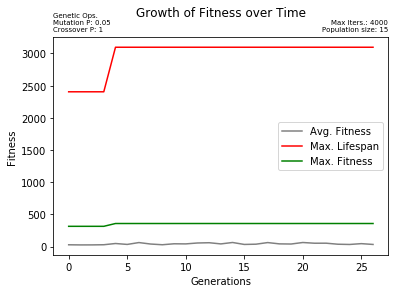

In [13]:
import matplotlib
import matplotlib.pyplot as plt

f, axs = plt.subplots(1, 1, sharex = True, sharey = True)
plt.plot(fit_rise, c="gray", label="Avg. Fitness")
plt.plot(l_g, c="red", label="Max. Lifespan")
plt.plot(fit_max_rise, c="green", label = "Max. Fitness")
plt.title("Growth of Fitness over Time\n")
plt.title("Max Iters.: "+str(In)+"\nPopulation size: "+str(len(new_pop.members)),loc="right",fontdict = {'fontsize': 7})
plt.title("Genetic Ops.\nMutation P: "+str(Pm)+"\nCrossover P: "+str(Pr),loc="left",fontdict = {'fontsize': 7})

axs.set_xlabel("Generations")
axs.set_ylabel("Fitness")
axs.legend()
plt.show() 
